In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from wordcloud import WordCloud

In [13]:
salary_data = pd.read_json('https://data.cityofnewyork.us/resource/k397-673e.json?$limit=6000000')

In [37]:
%%time
salary_data.to_parquet('/mnt/i/data/2023-nyc-salaries.pq')

In [45]:
!ls -lh /mnt/i/data

total 204M
-rwxrwxrwx 1 nkrishna nkrishna 204M Mar 23 14:42 2023-nyc-salaries.pq


In [4]:
salary_data = pd.read_parquet('/mnt/i/data/2023-nyc-salaries.pq')

In [5]:
salary_data1 = salary_data[salary_data.fiscal_year == 2023]
salary_data1.describe()

,fiscal_year,payroll_number,base_salary,regular_hours,regular_gross_paid,ot_hours,total_ot_paid,total_other_pay
count,552938.0,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000
mean,2023.0,573.035691,51337.371450,650.797779,47342.361612,72.551699,4575.784169,4352.708365
std,0.0,307.570095,48070.639384,883.960010,44230.169847,187.328651,12978.876359,7801.349333
min,2023.0,2.000000,1.000000,-1529.270000,-82023.270000,-96.750000,-7096.640000,-205944.480000
25%,2023.0,300.000000,33.180000,0.000000,4913.157500,0.000000,0.000000,0.000000
50%,2023.0,742.000000,48755.000000,0.000000,39244.800000,0.000000,0.000000,662.790000
75%,2023.0,747.000000,92073.000000,1820.000000,84744.340000,1.000000,83.882500,5646.572500
max,2023.0,996.000000,363346.000000,6666.000000,409058.380000,3172.500000,245420.330000,479358.000000


In [6]:
salary_data1 = salary_data1.dropna(subset=['regular_gross_paid'])
salary_data1.regular_gross_paid = salary_data1.regular_gross_paid.astype(int)

In [7]:
salary_data1.describe()

,fiscal_year,payroll_number,base_salary,regular_hours,regular_gross_paid,ot_hours,total_ot_paid,total_other_pay
count,552938.0,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000
mean,2023.0,573.035691,51337.371450,650.797779,47341.943592,72.551699,4575.784169,4352.708365
std,0.0,307.570095,48070.639384,883.960010,44230.161571,187.328651,12978.876359,7801.349333
min,2023.0,2.000000,1.000000,-1529.270000,-82023.000000,-96.750000,-7096.640000,-205944.480000
25%,2023.0,300.000000,33.180000,0.000000,4913.000000,0.000000,0.000000,0.000000
50%,2023.0,742.000000,48755.000000,0.000000,39244.000000,0.000000,0.000000,662.790000
75%,2023.0,747.000000,92073.000000,1820.000000,84744.000000,1.000000,83.882500,5646.572500
max,2023.0,996.000000,363346.000000,6666.000000,409058.000000,3172.500000,245420.330000,479358.000000


In [8]:
salary_data1.columns

Index(['fiscal_year', 'payroll_number', 'agency_name', 'last_name',
       'first_name', 'mid_init', 'agency_start_date', 'work_location_borough',
       'title_description', 'leave_status_as_of_june_30', 'base_salary',
       'pay_basis', 'regular_hours', 'regular_gross_paid', 'ot_hours',
       'total_ot_paid', 'total_other_pay'],
      dtype='object')

In [9]:
title_salary = salary_data1.sort_values('regular_gross_paid')

In [31]:
def make_wordclouds(title_salary, num_bins = 10, start_quantile = 0, *, use_bigrams=False):
    bin_size = int(len(title_salary) / num_bins)
    boundaries = [None] + list(range(1 * bin_size, num_bins * bin_size, bin_size)) + [None]
    quantiles = []
    for lo, hi in zip(boundaries[:-1], boundaries[1:]):
        quantiles.append(title_salary[lo:hi])


    for idx, quantile in enumerate(quantiles[start_quantile:]):
        wc = WordCloud(width=800, height=400, collocations=use_bigrams)
        # Since runs of jobs like Assistant Principal Assistant Principal will generate weird bigrams
        # we will shuffle each quantile's data if using bigrams
        if use_bigrams:
            index_copy = quantile.index.values.copy()
            np.random.shuffle(index_copy)
            wc.generate_from_text(' '.join(title for title in quantile.loc[index_copy].title_description if title))
        else:
            wc.generate_from_text(' '.join(title for title in quantile.title_description if title))
        # Note that the ranges use the unshuffled data
        print(f'Quantile {start_quantile + idx+1}: {quantile.regular_gross_paid.iloc[0]} - '
              f'{quantile.regular_gross_paid.iloc[-1]}, '
              f'{len(quantile)} salaries')
        display(wc.to_image())

# Unigrams

## Deciles

Quantile 1: -82023 - 547, 55293 salaries


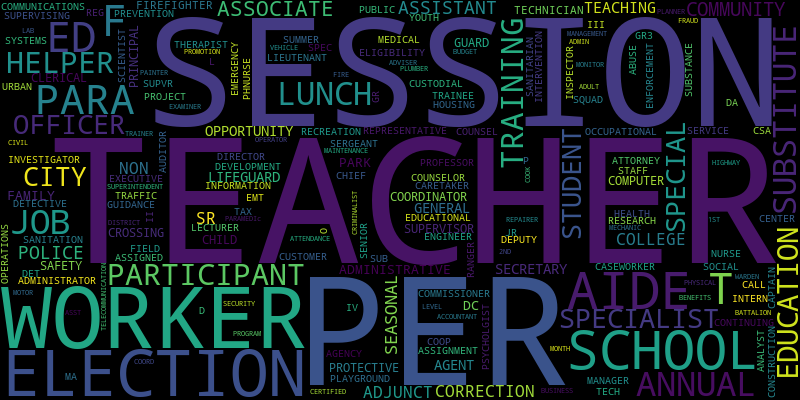

Quantile 2: 547 - 2528, 55293 salaries


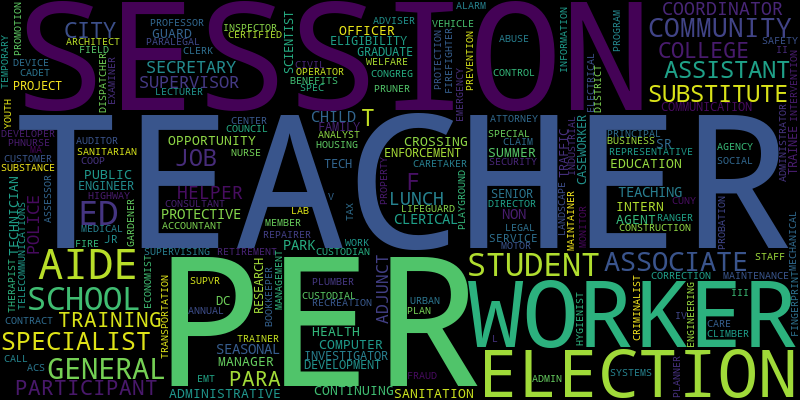

Quantile 3: 2528 - 8267, 55293 salaries


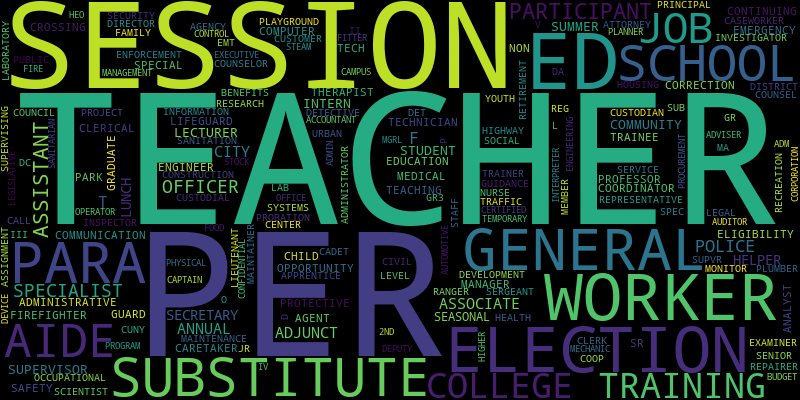

Quantile 4: 8267 - 20432, 55293 salaries


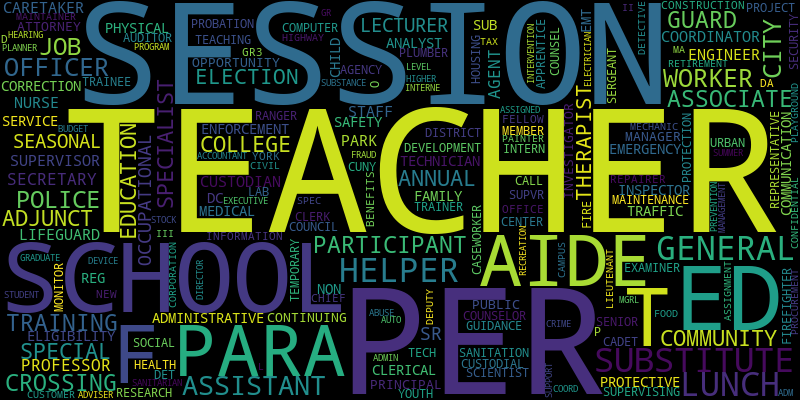

Quantile 5: 20432 - 39242, 55293 salaries


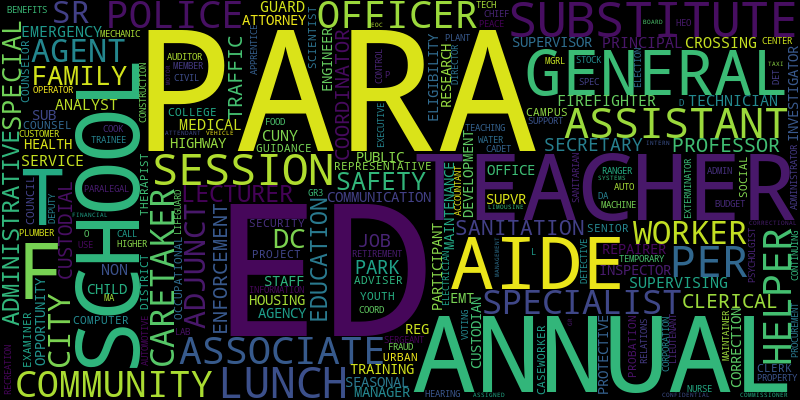

Quantile 6: 39243 - 52545, 55293 salaries


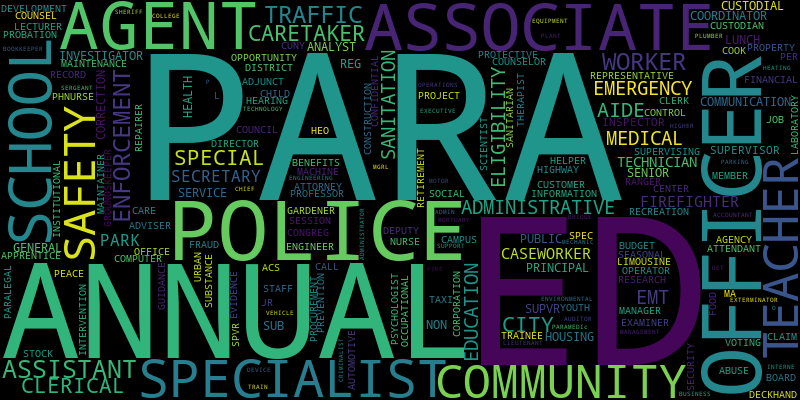

Quantile 7: 52545 - 74253, 55293 salaries


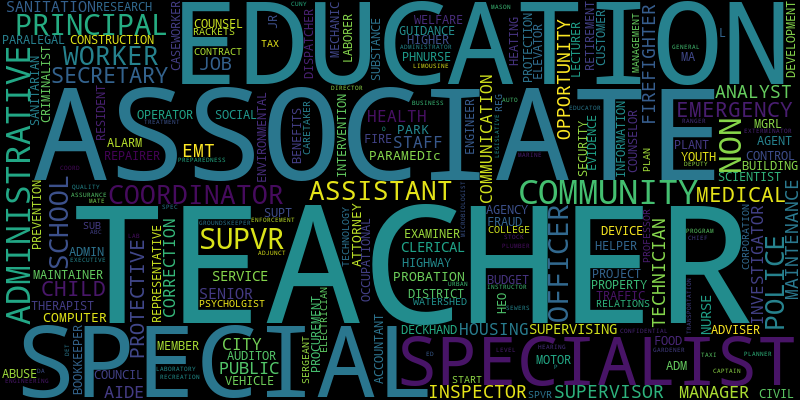

Quantile 8: 74253 - 91444, 55293 salaries


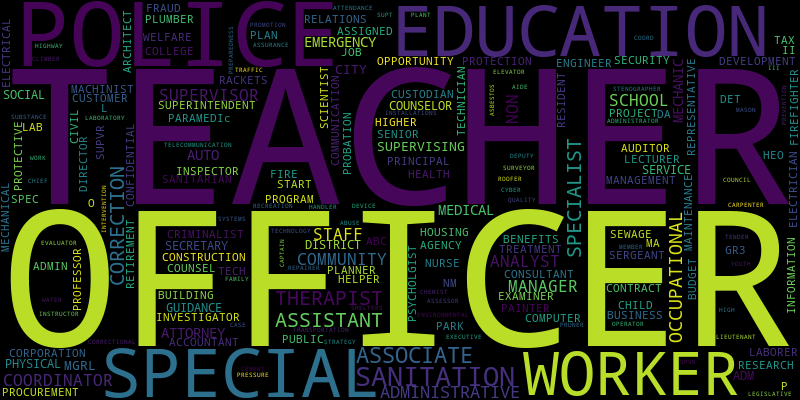

Quantile 9: 91444 - 109852, 55293 salaries


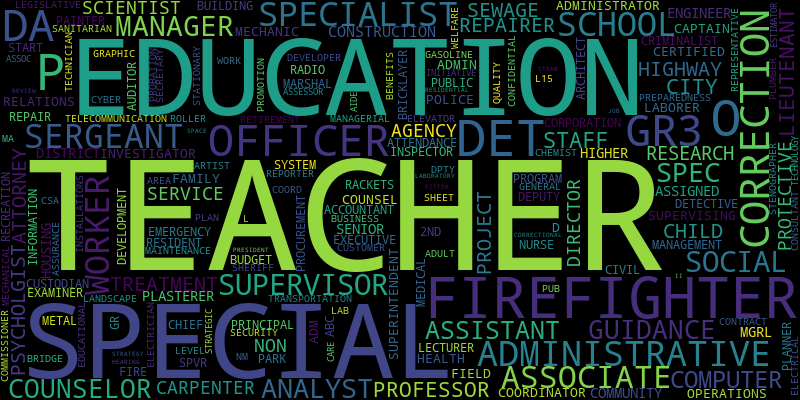

Quantile 10: 109852 - 409058, 55301 salaries


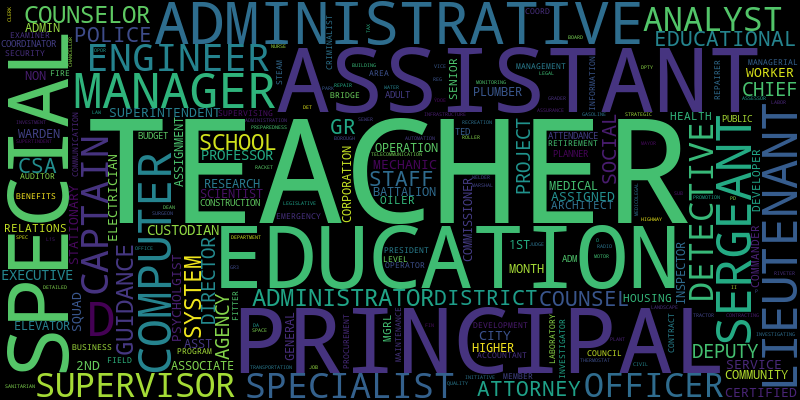

In [12]:
make_wordclouds(title_salary)

## Top Decile By Percentile

Quantile 91: 109852 - 111349, 5529 salaries


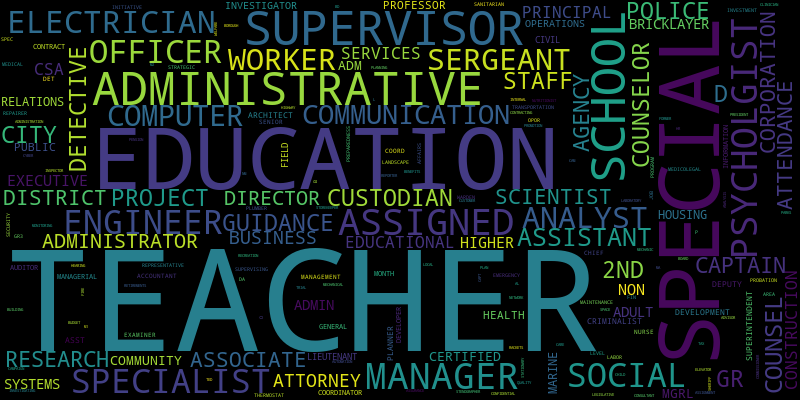

Quantile 92: 111349 - 115764, 5529 salaries


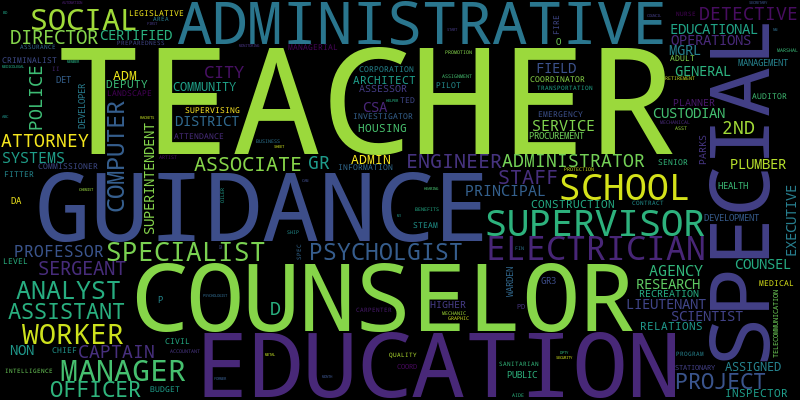

Quantile 93: 115764 - 118509, 5529 salaries


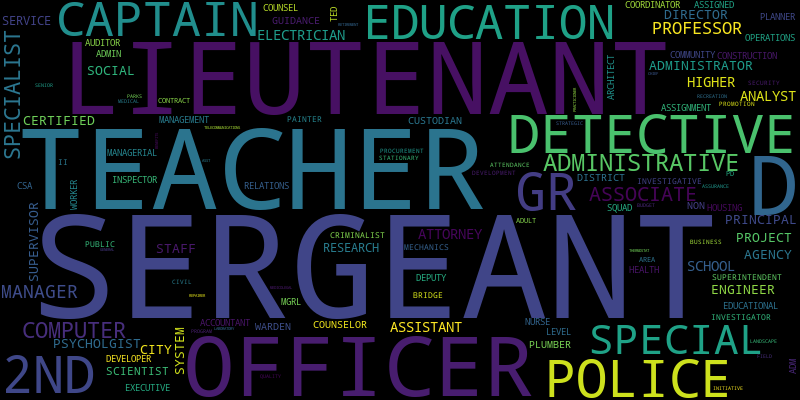

Quantile 94: 118509 - 121611, 5529 salaries


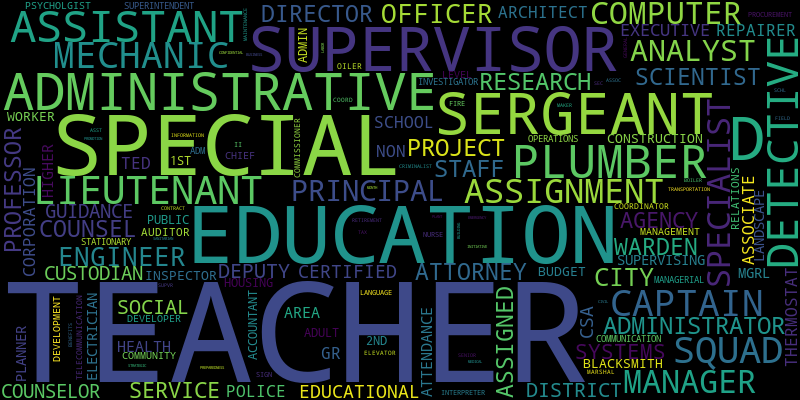

Quantile 95: 121611 - 125756, 5529 salaries


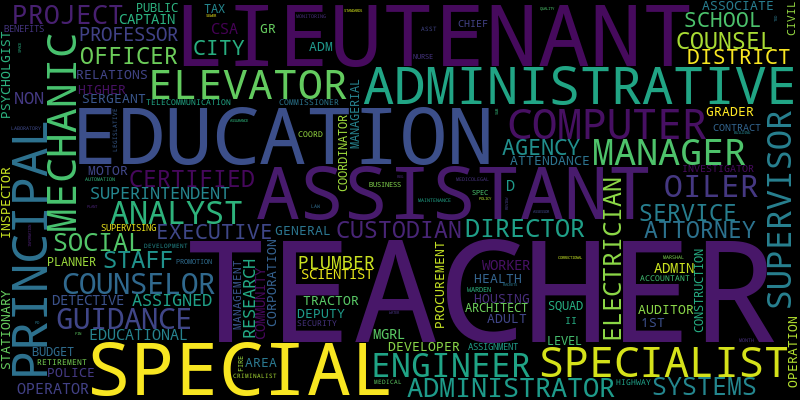

Quantile 96: 125759 - 128657, 5529 salaries


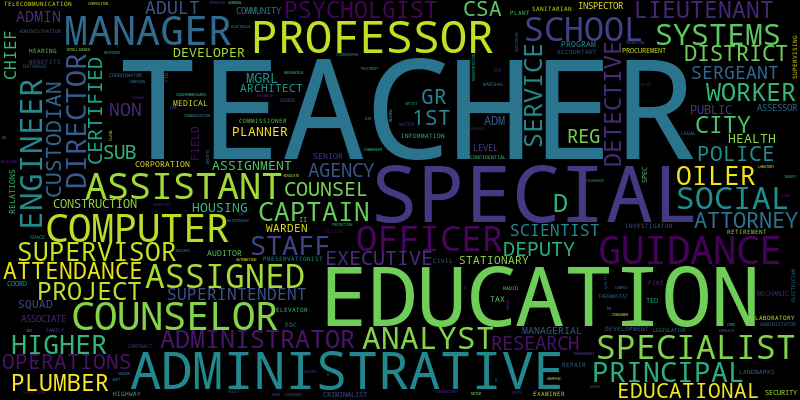

Quantile 97: 128657 - 132288, 5529 salaries


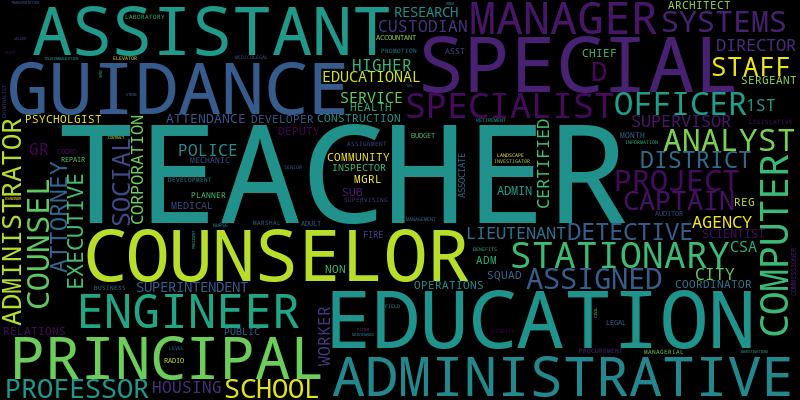

Quantile 98: 132288 - 140532, 5529 salaries


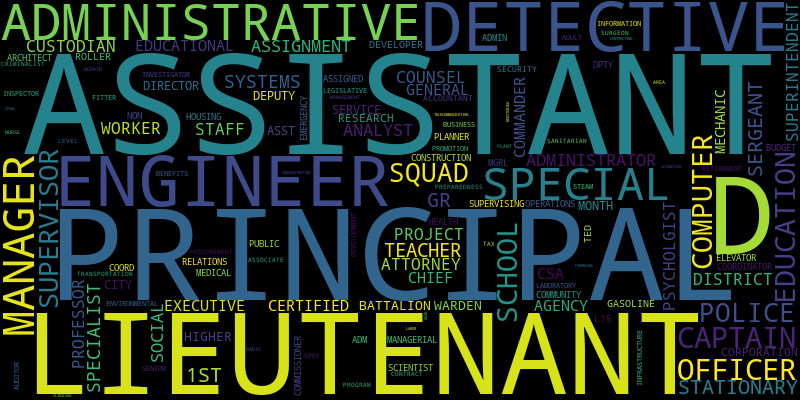

Quantile 99: 140532 - 160962, 5529 salaries


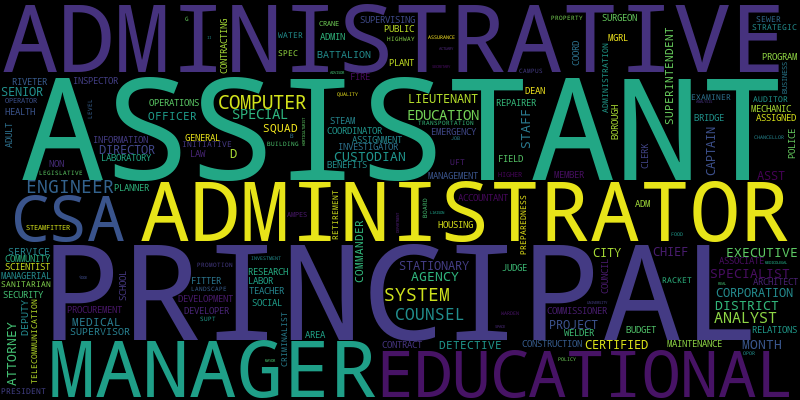

Quantile 100: 160962 - 409058, 5567 salaries


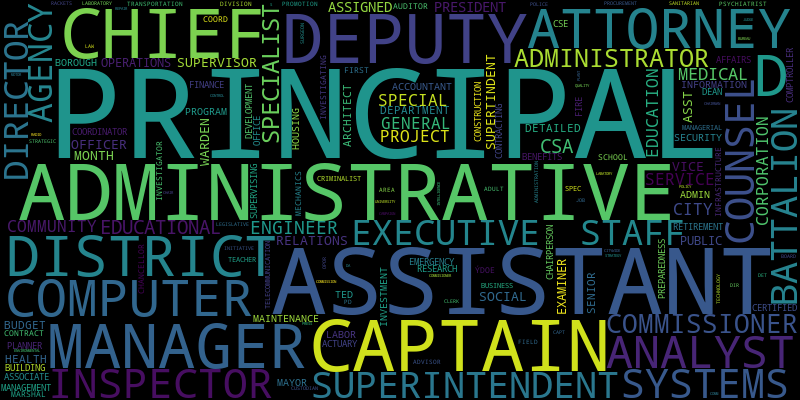

In [13]:
make_wordclouds(title_salary, 100, 90)

## The 1%

Quantile 991: 155512 - 158839, 552 salaries


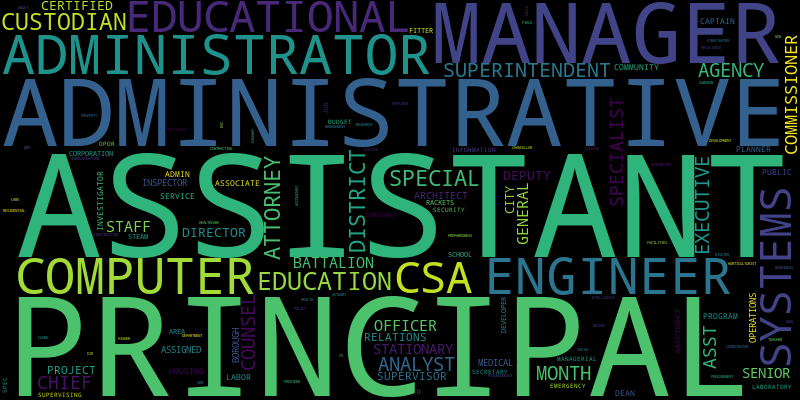

Quantile 992: 158852 - 162839, 552 salaries


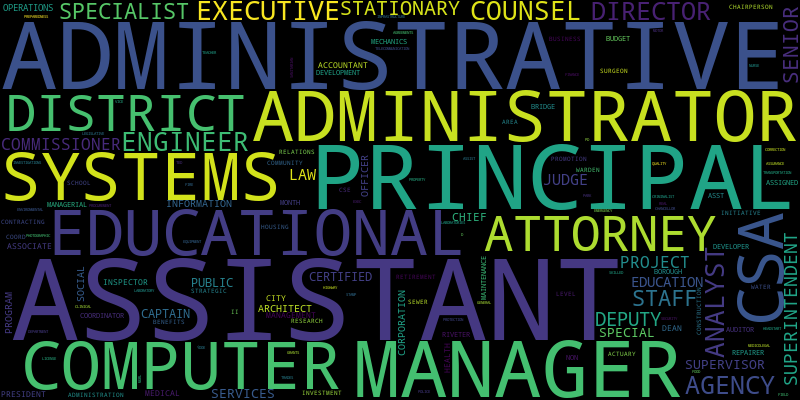

Quantile 993: 162849 - 166786, 552 salaries


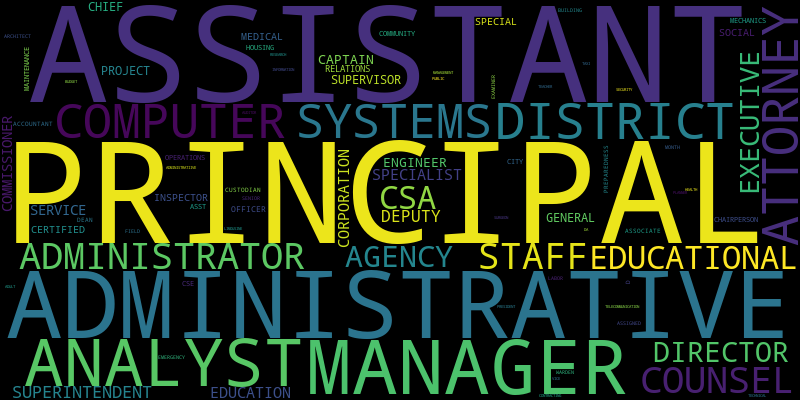

Quantile 994: 166803 - 169834, 552 salaries


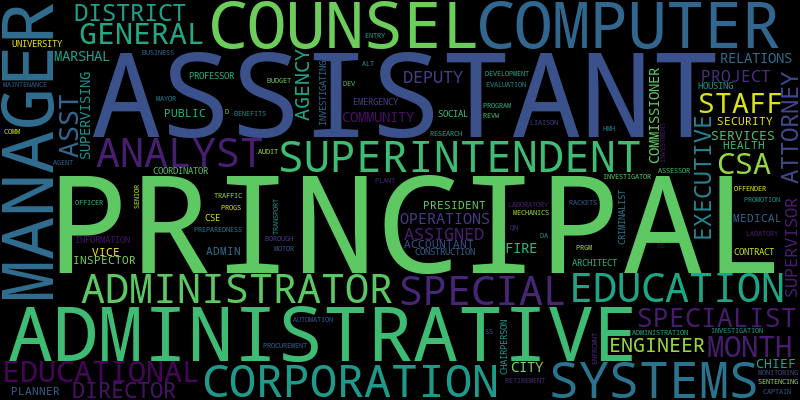

Quantile 995: 169834 - 174520, 552 salaries


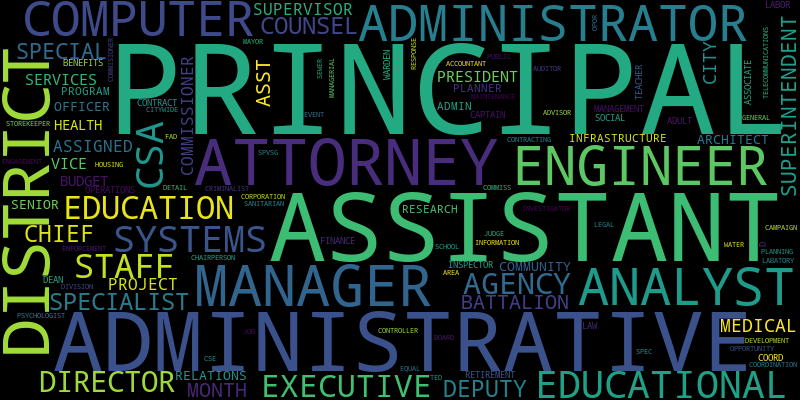

Quantile 996: 174520 - 176218, 552 salaries


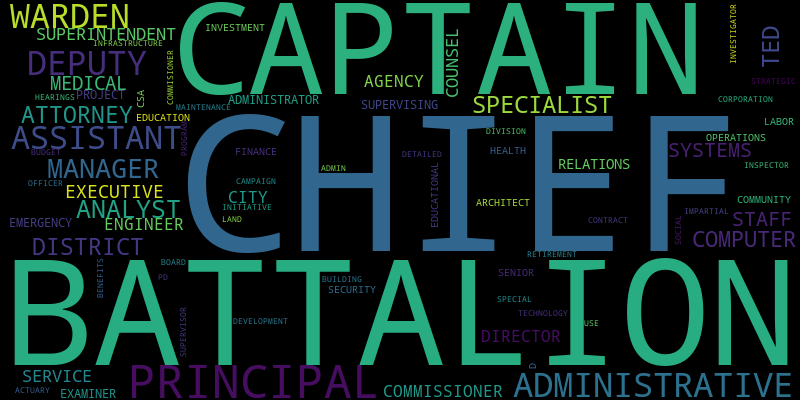

Quantile 997: 176218 - 181650, 552 salaries


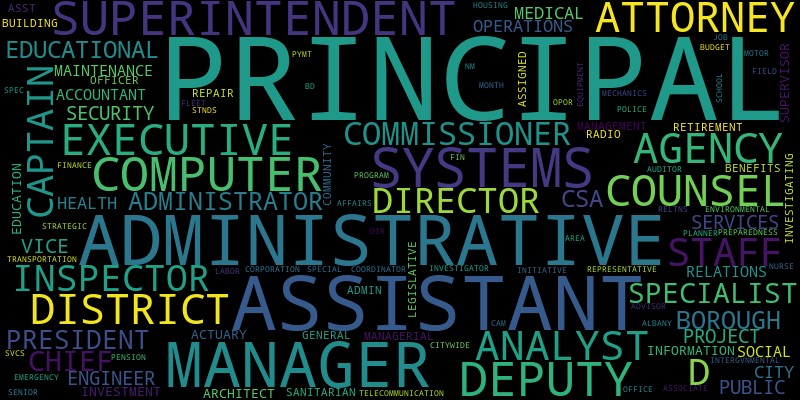

Quantile 998: 181660 - 185886, 552 salaries


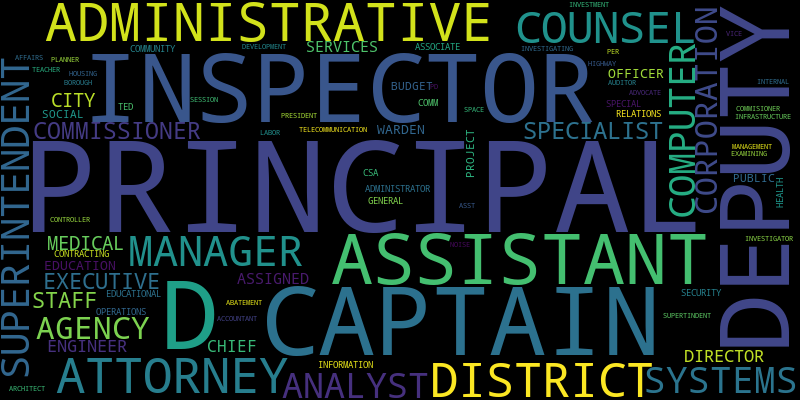

Quantile 999: 185886 - 191371, 552 salaries


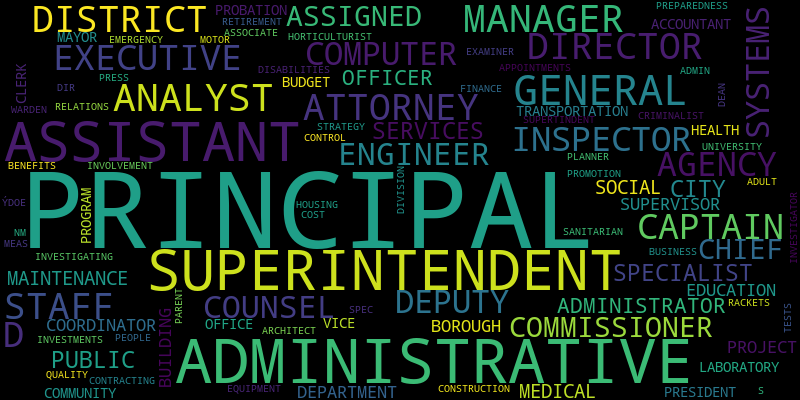

Quantile 1000: 191371 - 409058, 1490 salaries


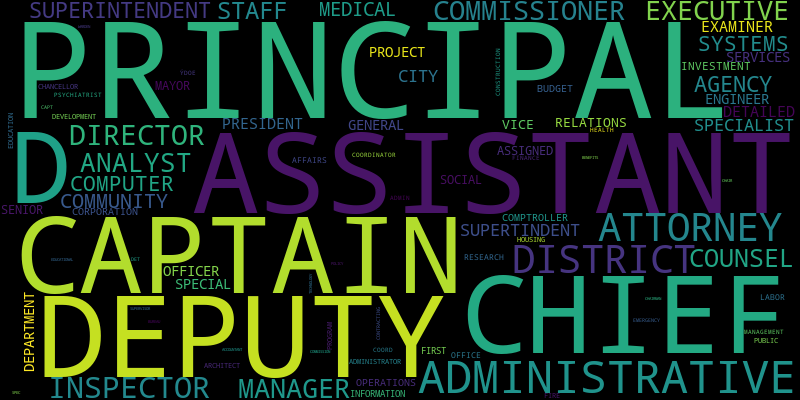

In [15]:
make_wordclouds(title_salary, 1000, 990)

# Bigrams

## Deciles

Quantile 1: -82023 - 547, 55293 salaries


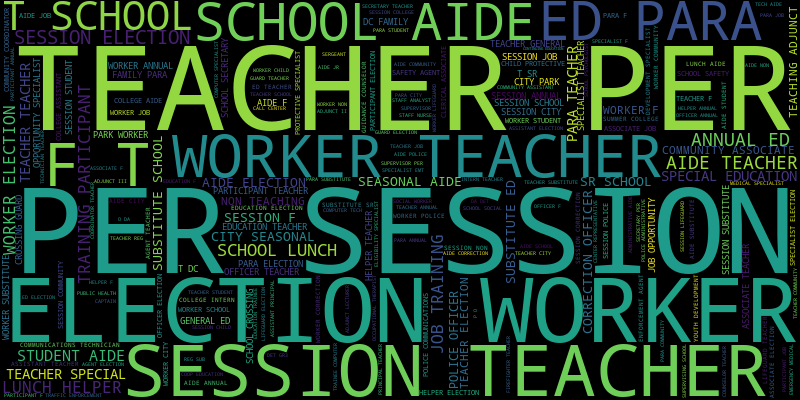

Quantile 2: 547 - 2528, 55293 salaries


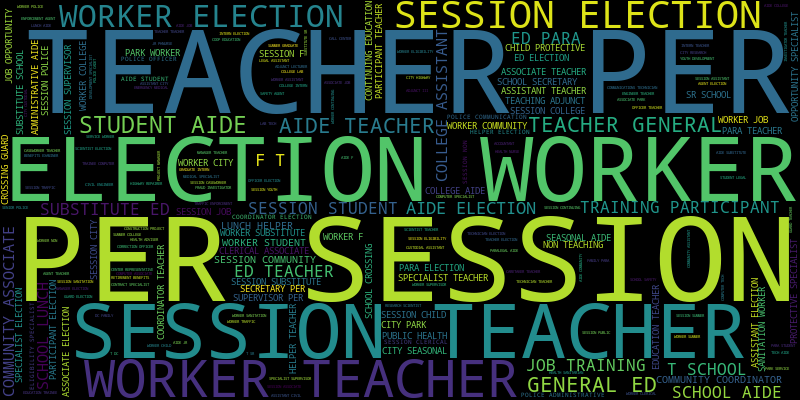

Quantile 3: 2528 - 8267, 55293 salaries


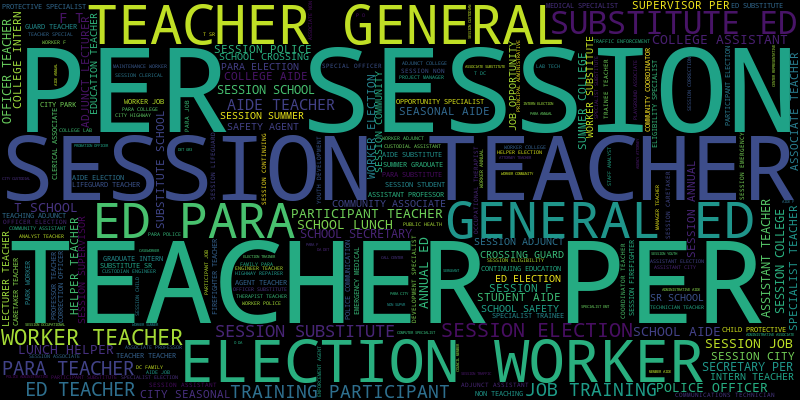

Quantile 4: 8267 - 20432, 55293 salaries


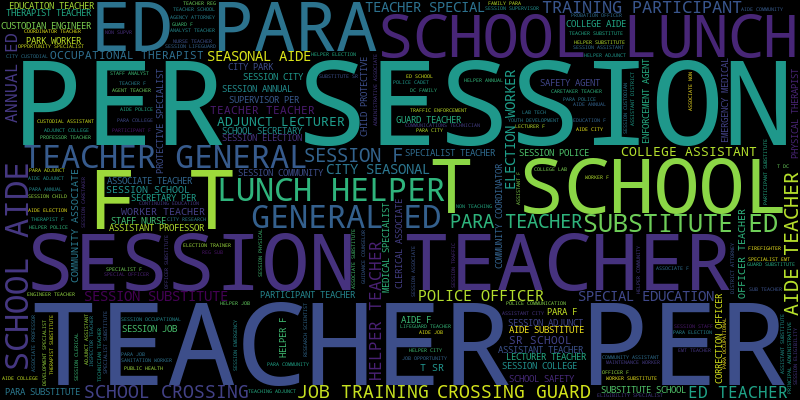

Quantile 5: 20432 - 39242, 55293 salaries


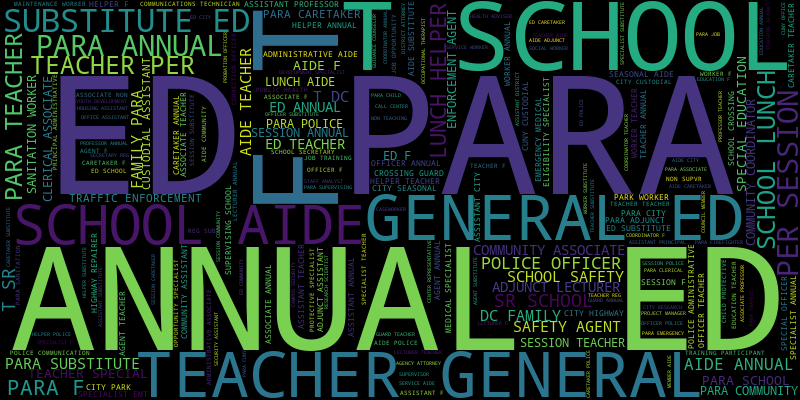

Quantile 6: 39243 - 52545, 55293 salaries


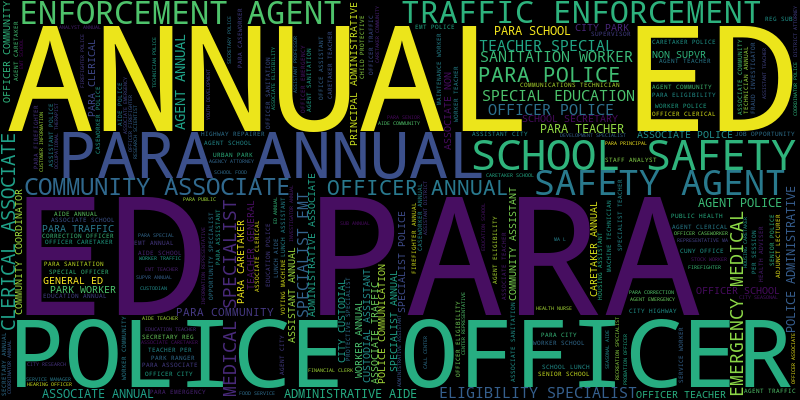

Quantile 7: 52545 - 74253, 55293 salaries


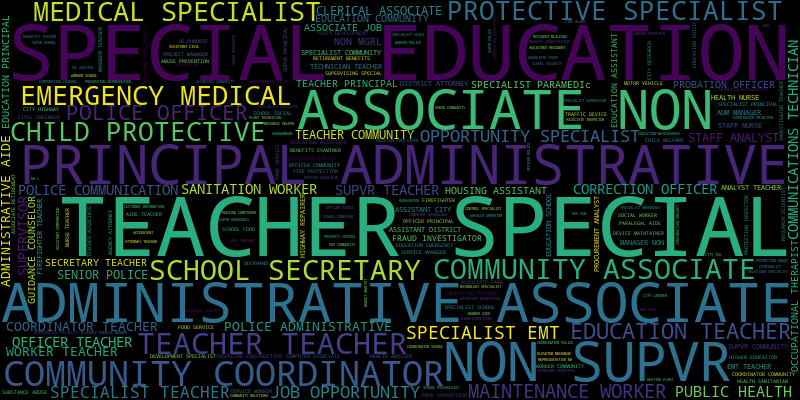

Quantile 8: 74253 - 91444, 55293 salaries


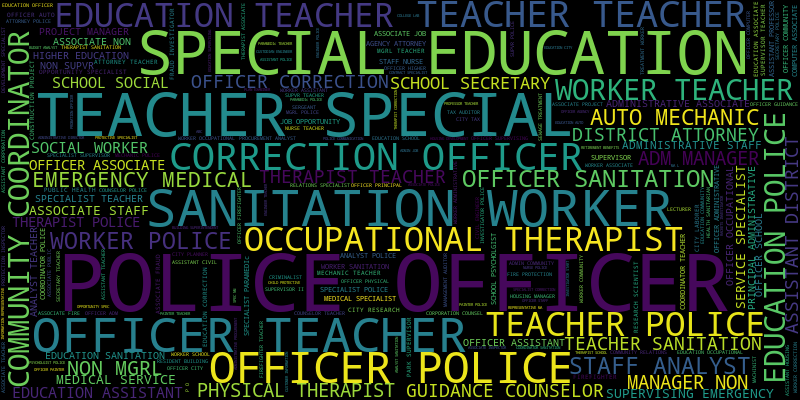

Quantile 9: 91444 - 109852, 55293 salaries


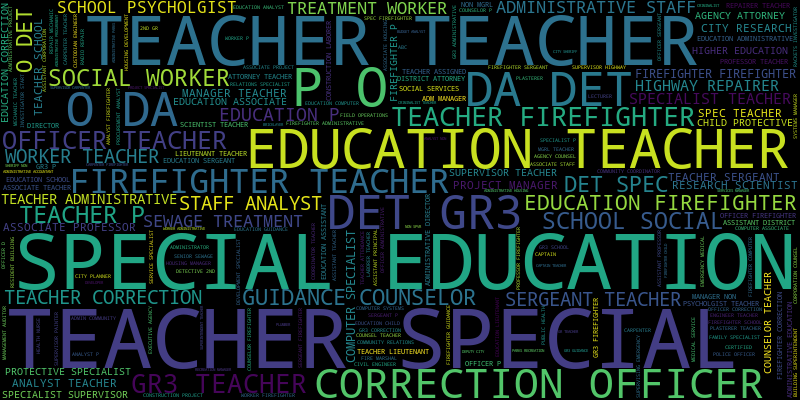

Quantile 10: 109852 - 409058, 55301 salaries


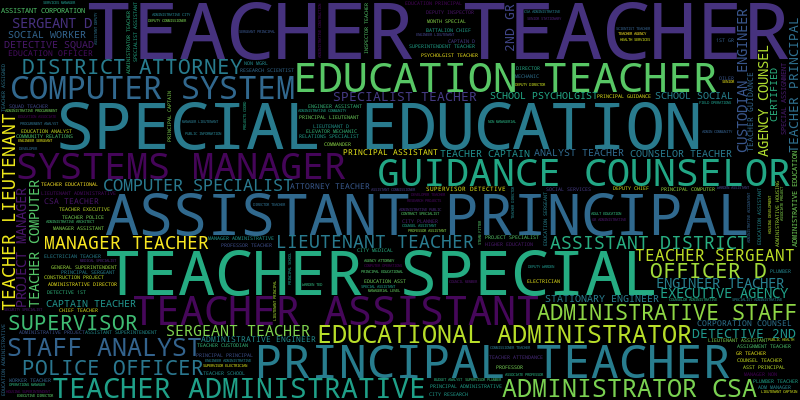

In [32]:
make_wordclouds(title_salary, use_bigrams=True)

## Top Decile By Percentile

Quantile 91: 109852 - 111349, 5529 salaries


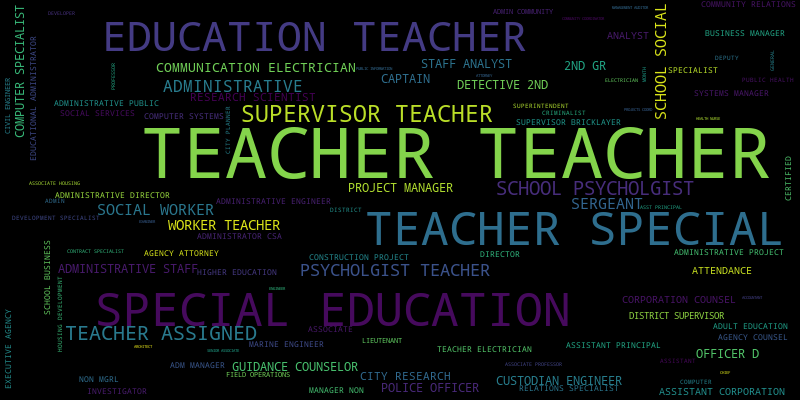

Quantile 92: 111349 - 115764, 5529 salaries


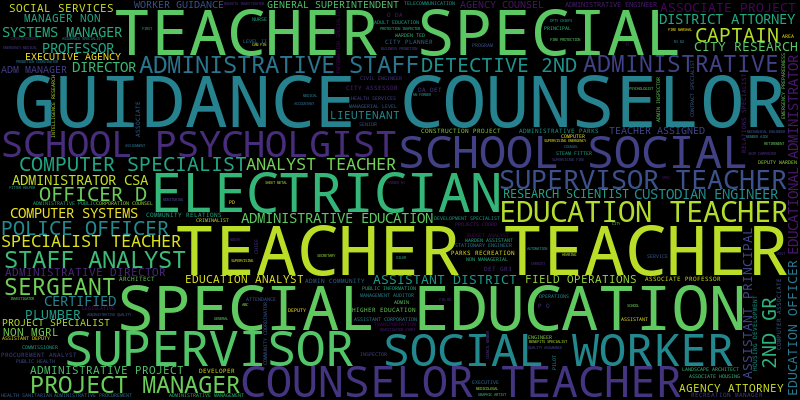

Quantile 93: 115764 - 118509, 5529 salaries


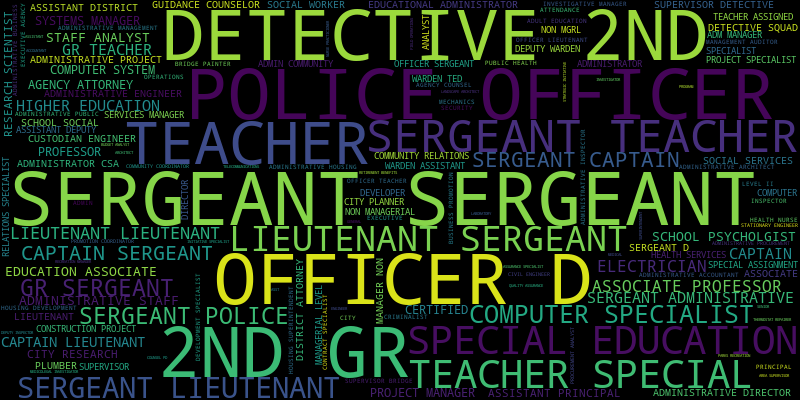

Quantile 94: 118509 - 121611, 5529 salaries


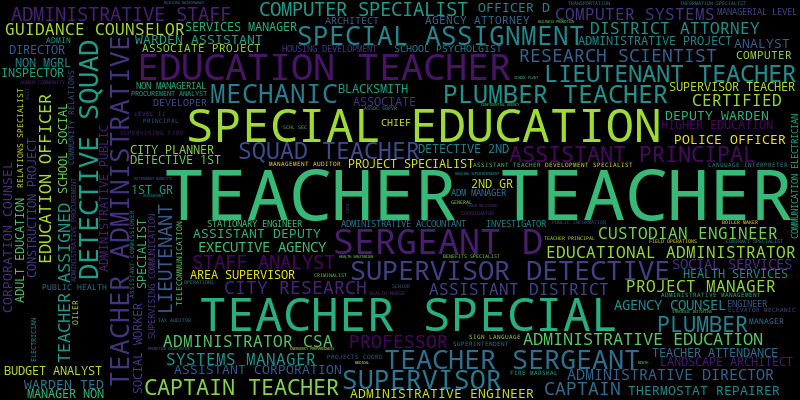

Quantile 95: 121611 - 125756, 5529 salaries


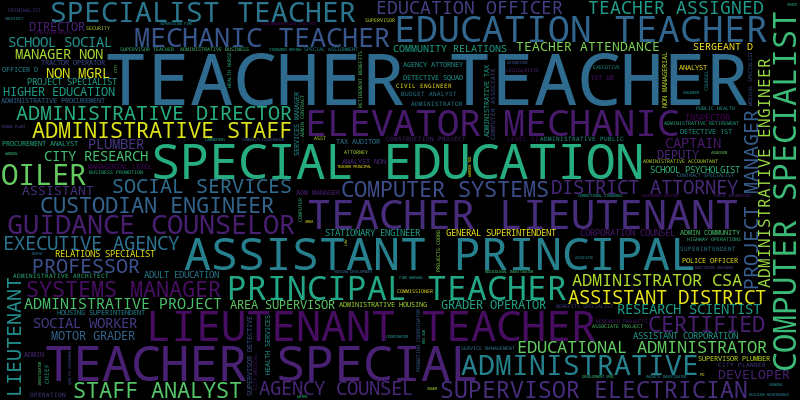

Quantile 96: 125759 - 128657, 5529 salaries


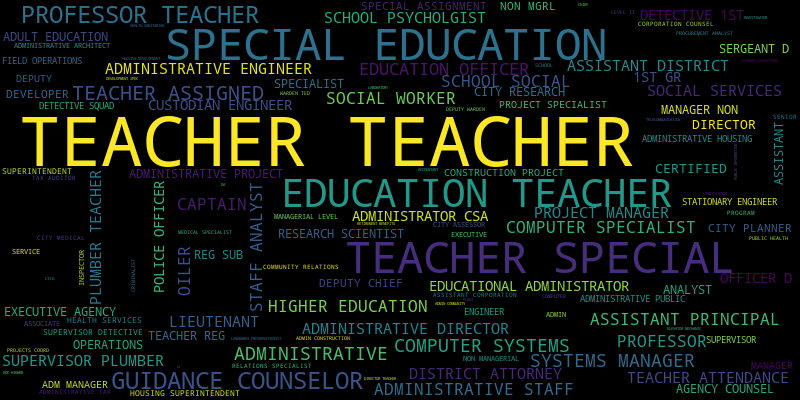

Quantile 97: 128657 - 132288, 5529 salaries


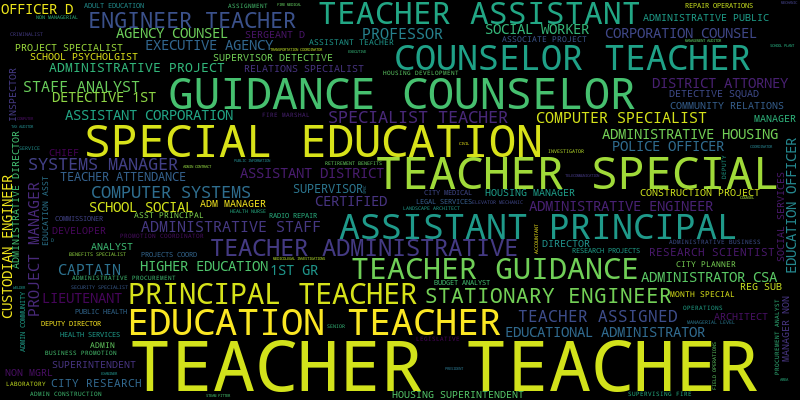

Quantile 98: 132288 - 140532, 5529 salaries


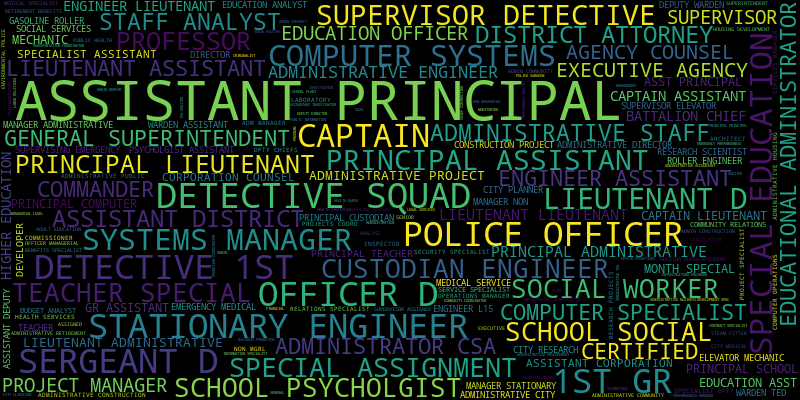

Quantile 99: 140532 - 160962, 5529 salaries


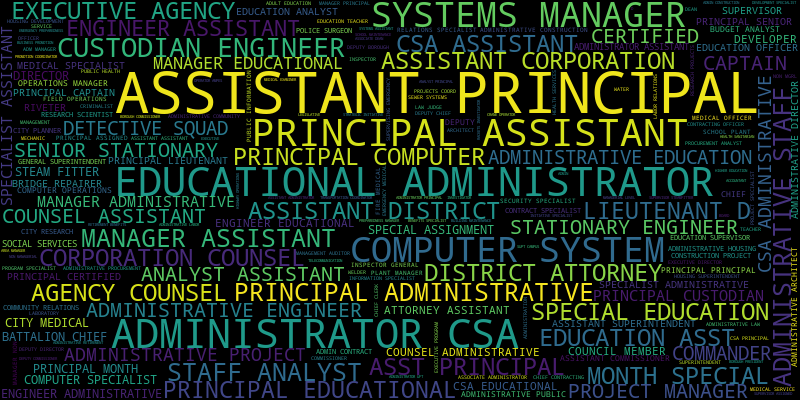

Quantile 100: 160962 - 409058, 5567 salaries


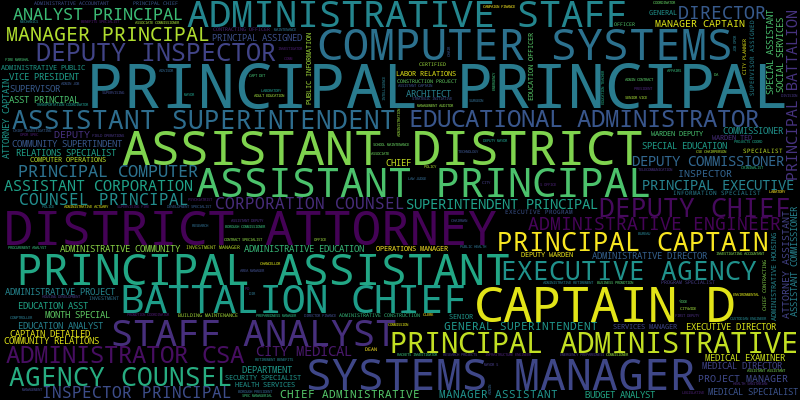

In [33]:
make_wordclouds(title_salary, 100, 90, use_bigrams=True)

## The 1%

Quantile 991: 155512 - 158839, 552 salaries


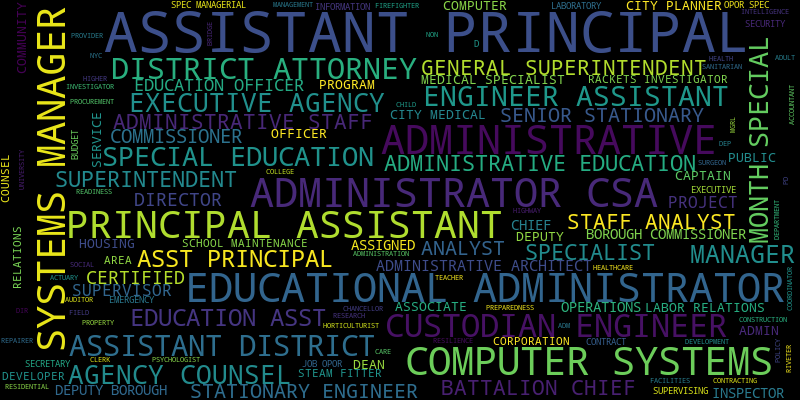

Quantile 992: 158852 - 162839, 552 salaries


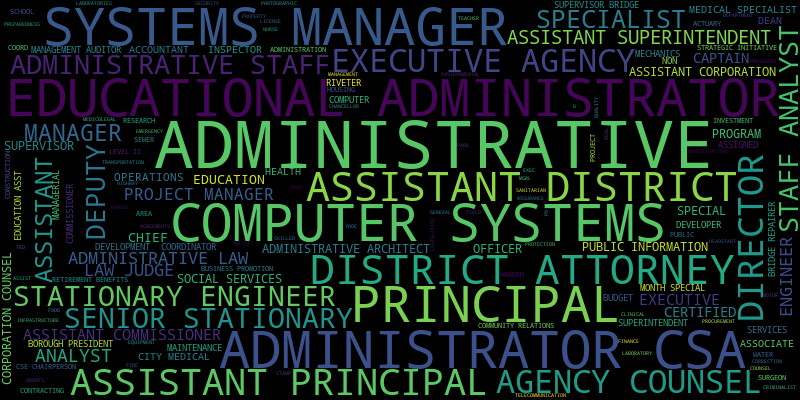

Quantile 993: 162849 - 166786, 552 salaries


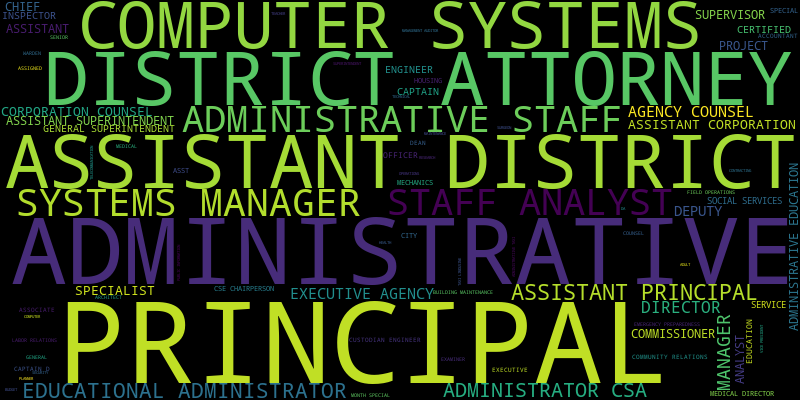

Quantile 994: 166803 - 169834, 552 salaries


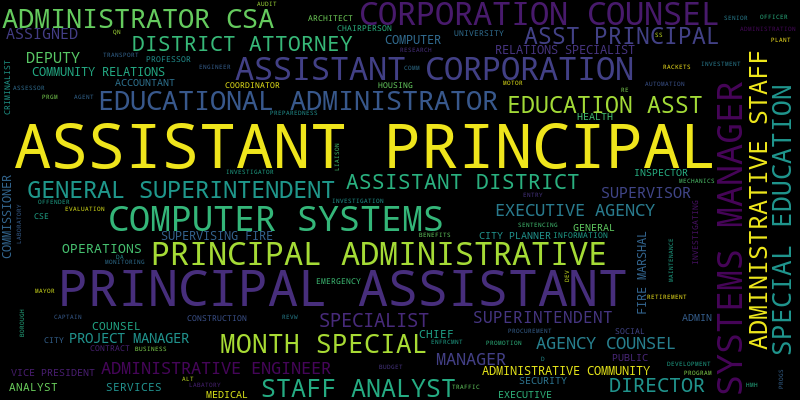

Quantile 995: 169834 - 174520, 552 salaries


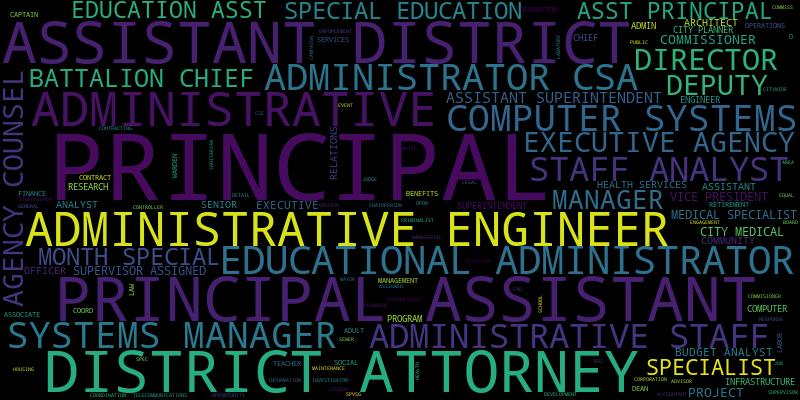

Quantile 996: 174520 - 176218, 552 salaries


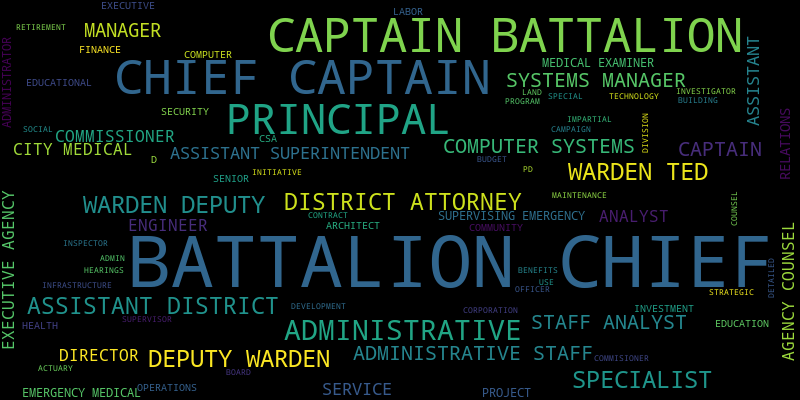

Quantile 997: 176218 - 181650, 552 salaries


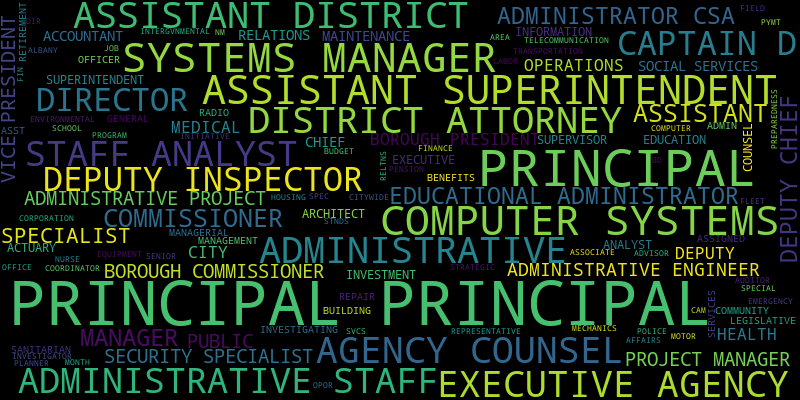

Quantile 998: 181660 - 185886, 552 salaries


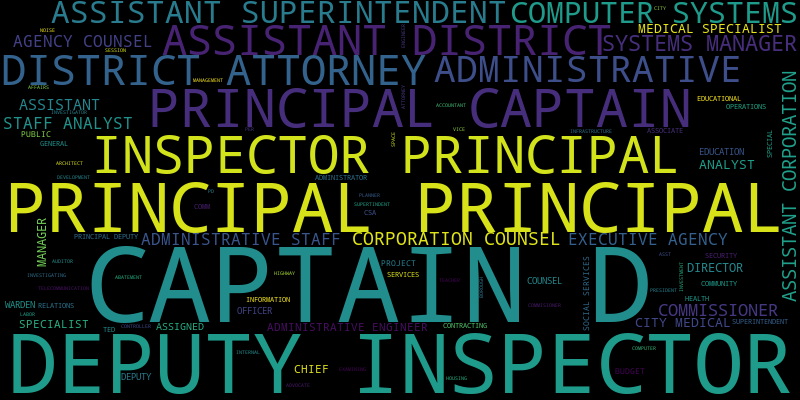

Quantile 999: 185886 - 191371, 552 salaries


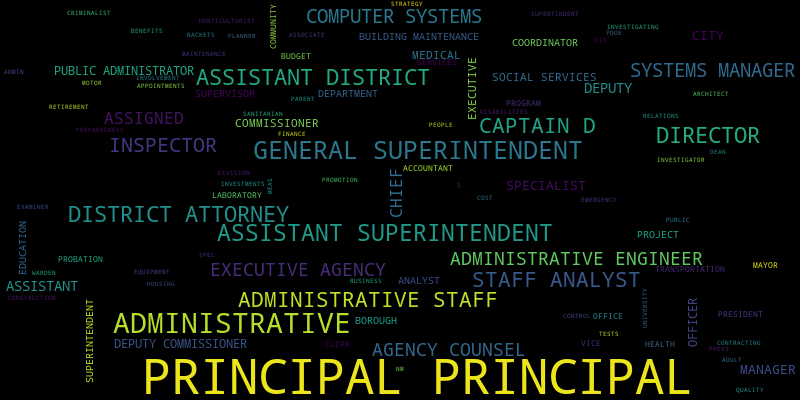

Quantile 1000: 191371 - 409058, 1490 salaries


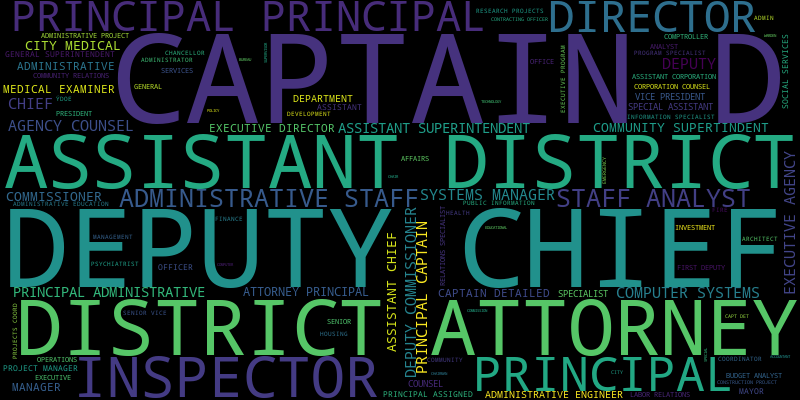

In [34]:
make_wordclouds(title_salary, 1000, 990, use_bigrams=True)